In [3]:
pip install contextily


     -------------------------------------- 119.8/119.8 kB 1.4 MB/s eta 0:00:00
     ---------------------------------------- 40.3/40.3 kB ? eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [4]:
import osmnx as ox
import folium
import contextily as cx
import matplotlib.pyplot as plt

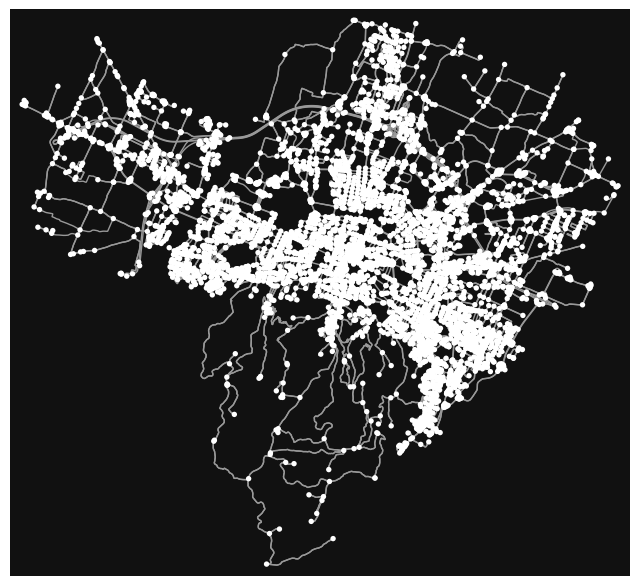

(<Figure size 800x800 with 1 Axes>, <Axes: >)

In [5]:
PLACE_NAME = 'Bologna, Italy'
G = ox.graph_from_place(PLACE_NAME, network_type='drive')
ox.plot_graph(G)  

In [6]:
ox.plot_graph_folium(G)

C:\Users\Tyler Marino\AppData\Local\Temp\ipykernel_2856\607548164.py:1: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_graph_folium(G)


In [7]:
G = ox.graph_from_place(PLACE_NAME, network_type='bike')

In [8]:
area,edges = ox.graph_to_gdfs(G)
area.head()

,y,x,street_count,highway,ref,geometry
osmid,,,,,,
33344145,44.497690,11.350392,4,NaN,NaN,POINT (11.35039 44.49769)
82550591,44.494240,11.346465,4,traffic_signals,NaN,POINT (11.34647 44.49424)
82550595,44.491467,11.346466,4,traffic_signals,NaN,POINT (11.34647 44.49147)
82550597,44.487171,11.348167,3,NaN,NaN,POINT (11.34817 44.48717)
82550600,44.486083,11.348285,3,NaN,NaN,POINT (11.34829 44.48608)


In [9]:
fuel_stations = ox.geometries_from_place(
    PLACE_NAME,
    {"amenity": "fuel"},
)
fuel_stations.head()

C:\Users\Tyler Marino\AppData\Local\Temp\ipykernel_2856\4033279897.py:1: UserWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in a future release.
  fuel_stations = ox.geometries_from_place(


amenity     brand brand:wikidata  \
element_type osmid                                        
node         226920788    fuel        Q8       Q1634762   
             226925846    fuel        IP        Q646807   
             226930667    fuel  Agip Eni        Q377915   
             226931028    fuel       Api        Q646807   
             226950111    fuel       Erg        Q739503   

                                        brand:wikipedia fuel:GTL_diesel  \
element_type osmid                                                        
node         226920788  en:Kuwait Petroleum Corporation             yes   
             226925846      en:Anonima Petroli Italiana             NaN   
             226930667                          en:Agip             yes   
             226931028  en:American Petroleum Institute             NaN   
             226950111                              NaN             NaN   

                       fuel:diesel fuel:lpg fuel:octane_100 fuel:octane_95  \
element_type osmid                                                           
node         226920788         yes      yes             yes            yes   
             226925846         yes      NaN             NaN            NaN   
             226930667         yes      NaN             yes            yes   
             226931028         yes      NaN             NaN            yes   
             226950111         NaN      NaN             NaN            NaN   

                        name  ... name:it addr:district branch nodes building  \
element_type osmid            ...                                               
node         226920788    Q8  ...     NaN           NaN    NaN   NaN      NaN   
             226925846    IP  ...     NaN           NaN    NaN   NaN      NaN   
             226930667  Agip  ...     NaN           NaN    NaN   NaN      NaN   
             226931028   Api  ...     NaN           NaN    NaN   NaN      NaN   
             226950111   Erg  ...     NaN           NaN    NaN   NaN      NaN   

                       fuel:HGV_diesel layer shop fuel:biodiesel source:date  
element_type osmid                                                            
node         226920788             NaN   NaN  NaN            NaN         NaN  
             226925846             NaN   NaN  NaN            NaN         NaN  
             226930667             NaN   NaN  NaN            NaN         NaN  
             226931028             NaN   NaN  NaN            NaN         NaN  
             226950111             NaN   NaN  NaN            NaN         NaN  

[5 rows x 44 columns]

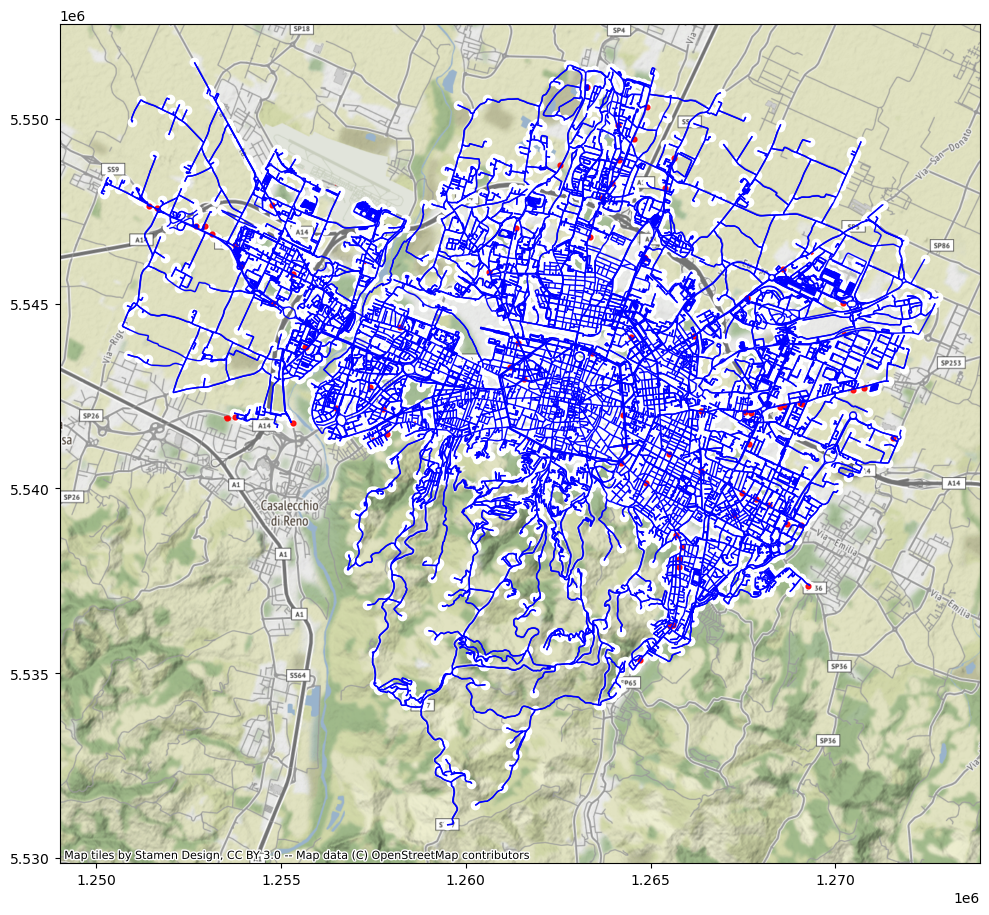

In [13]:
area_crs = area.to_crs('3857')
edges_crs = edges.to_crs('3857')
fuel_stations_crs = fuel_stations.to_crs('3857')

fig, ax = plt.subplots(figsize=(10, 14))
area_crs.plot(ax=ax, facecolor='white')
edges_crs.plot(ax=ax, linewidth=1, edgecolor='blue')
fuel_stations_crs.plot(ax=ax, color='red', alpha=0.9, markersize=12)
plt.tight_layout()
cx.add_basemap(ax,crs=area_crs.crs.to_string())

In [10]:
origin = (
    ox.geocode_to_gdf("Parco della Montagnola, Bologna, Italy") 
    .to_crs(edges.crs)  
    .at[0, "geometry"]  
    .centroid  
)

destination = (
    ox.geocode_to_gdf("Esso, Bologna, Italy")
    .to_crs(edges.crs)
    .at[0, "geometry"]
    .centroid 
)

origin_node_id = ox.nearest_nodes(G, origin.x, origin.y)
destination_node_id = ox.nearest_nodes(G, destination.x, destination.y)

In [11]:
route = ox.shortest_path(G, origin_node_id, destination_node_id)
route

[1628203487,
 7507621064,
 3287381534,
 245980299,
 250763179,
 250763533,
 4457864595,
 1629618087,
 1629618098,
 250734974,
 250734977,
 1629618106,
 1629618102,
 250763500,
 1646701915,
 250734921,
 8993064197,
 252167470,
 7608508164,
 251903325,
 1645734529,
 252167291,
 10874161420,
 252167321,
 3689075686,
 250734651,
 9910419841,
 9910419844,
 6428918393,
 399874090,
 5287623466,
 257615745,
 7574822196,
 803636125,
 3361815409,
 3368607672,
 9499089144,
 10876234323,
 10876234333,
 10088053731,
 252105453,
 252103298,
 252105266,
 7969547463,
 2119950033,
 2119950036,
 2119950038,
 2119950043,
 1247737516,
 252118563,
 252118565,
 252118570,
 252118573,
 664243793,
 664243813,
 664243814,
 664243798,
 1916621946,
 266405258,
 664243808,
 266397317,
 266405246,
 1611141300,
 266405252,
 266405255,
 1636396166,
 1636396173,
 2146478519,
 2146478520,
 2106921082,
 1707540911,
 254635783,
 254636638,
 8128947351,
 8128947368,
 280697043,
 280697041,
 280697039,
 280697532,
 169466

In [12]:
ox.plot_route_folium(G, route, route_linewidth=6, node_size=0)


C:\Users\Tyler Marino\AppData\Local\Temp\ipykernel_2856\2457640564.py:1: UserWarning: The `folium` module has been deprecated and will be removed in a future release. You can generate and explore interactive web maps of graph nodes, edges, and/or routes automatically using GeoPandas.GeoDataFrame.explore instead, for example like: `ox.graph_to_gdfs(G, nodes=False).explore()`. See the OSMnx examples gallery for complete details and demonstrations.
  ox.plot_route_folium(G, route, route_linewidth=6, node_size=0)
